In [87]:
# Import system requirements
import sys, os

# Import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Use NetworkX graphic package to create a signed network
import networkx as nx

In [88]:
# Import data

dataset = 'sp500' # values: 'asset_class','ftse','sectors','sp100'

os.chdir("../data_modified")

corr_tensor = np.load('%s_corr.npy' % (dataset)) #list of correlation matrices for each date
dates = np.load('%s_dates.npy' % (dataset)) #list of timestamps
nodes = np.load('%s_nodes.npy' % (dataset)) #list of tickers

num_examples = corr_tensor.shape[0] #number of dates
dim = corr_tensor.shape[1] #number of assets


In [89]:
# Helper Functions

def make_graph(corr_mat, node_labels, graph_type):

    G = nx.Graph()
    G.add_nodes_from(node_labels)
    dim = corr_mat.shape[0]

    if not dim == len(node_labels):
        raise ValueError('number node labels not = corr matrix dimensions')

    if graph_type=='signed':
        for i in range(dim):
            for j in range(i+1, dim):
                if corr_mat[i,j] < 0:
                    G.add_edge(node_labels[i], node_labels[j], sign=-1)
                elif corr_mat[i,j] > 0:
                    G.add_edge(node_labels[i], node_labels[j], sign=1)
    
    if graph_type=='corr':
        for i in range(dim):
            for j in range(i+1, dim):
                if corr_mat[i,j] != 0.000:
                    G.add_edge(node_labels[i], node_labels[j])
    
    if graph_type=='uncorr':
        for i in range(dim):
            for j in range(i+1, dim):
                if corr_mat[i,j] == 0.000:
                    G.add_edge(node_labels[i], node_labels[j])
    
    density = (2*G.number_of_edges())/(G.number_of_nodes()*(G.number_of_nodes() - 1))
                
    return G, density

def get_max_deg(G):
    degree_sequence = sorted([d for n, d in G.degree()], reverse=True)

    return max(degree_sequence)

def clique_size(clique):
    return len(clique)

In [90]:
corr_mat = corr_tensor[int(num_examples/2), :, :].copy() #take the correlation matrix for a specific date (for visualization)
corr_mat[(corr_mat > -1*0.5) & (corr_mat < 0.5)] = 0 #arbitrary threshold, for visualization purposes
G, density = make_graph(corr_mat, nodes, 'corr')

In [91]:
# from networkx.algorithms.community import greedy_modularity_communities
# c = list(greedy_modularity_communities(G))
# for item in c:
#     print(len(sorted(item)))

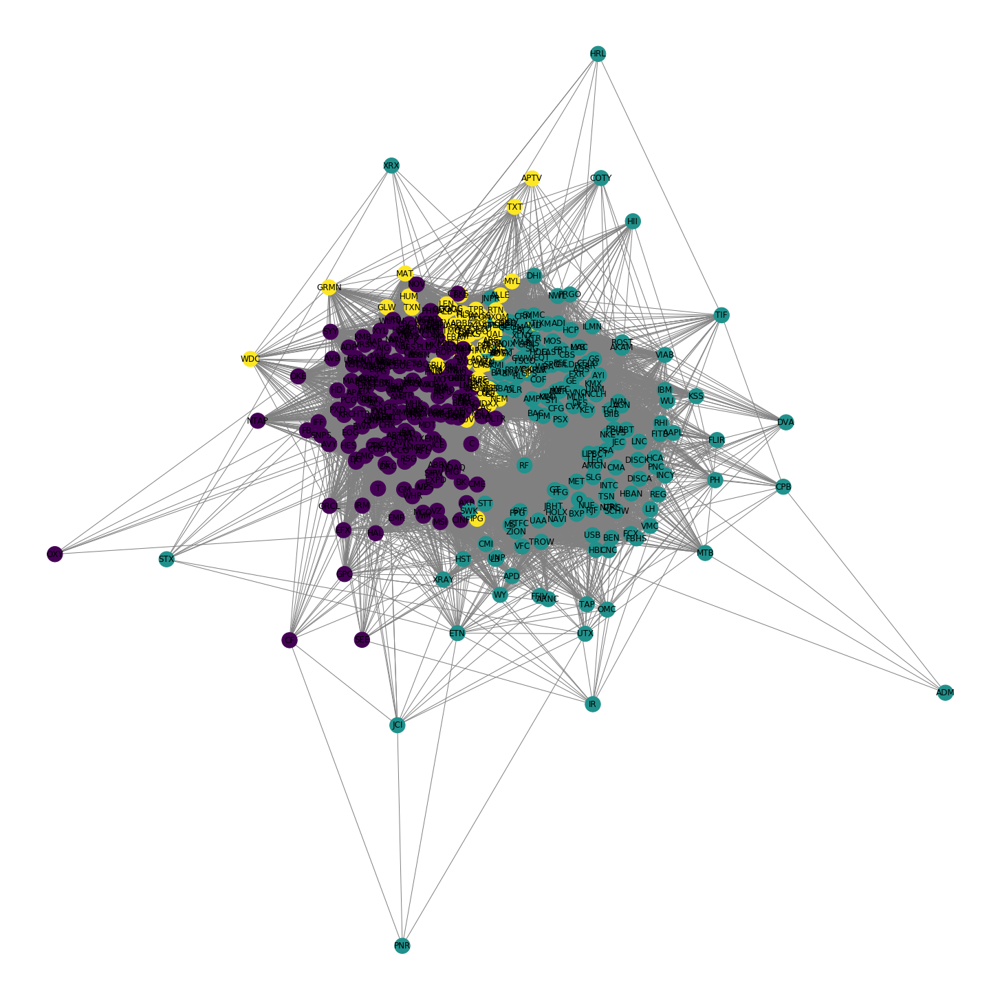

In [92]:
from community import community_louvain
import matplotlib.pyplot as plt
import networkx as nx
from random import randrange

# Find modularity
original_part = community_louvain.best_partition(G)
mod = community_louvain.modularity(original_part,G)
# print(part)
# print(mod)

# Plot, color nodes using community structure
#values = [part.get(node)+randrange(10)*0.1 for node in G.nodes()]
values = [original_part.get(node) for node in G.nodes()]

#print(values)
plt.figure(3,figsize=(20,20))
nx.draw_spring(G, node_color = values, node_size=500, with_labels=True, edge_color = 'grey')
plt.show()

In [ ]:
#sector grouping

os.chdir("../data_modified")
df = pd.read_csv("SP500_Sectors.csv")
sector_df = df[['Ticker', 'Sector']]
sector_df = sector_df.replace({'Sector':{'Communication Services': 1, 'Consumer Discretionary': 2, 'Consumer Staples': 3, 'Energy': 4,
                           'Financials': 5, 'Health Care': 6, 'Industrials': 7, 'Information Technology': 8, 'Materials': 9,
                           'Real Estate': 10, 'Utilities': 11}})

labels = {}
for node in G.nodes():
    if node in sector_df['Ticker'].to_list():
        node_label = sector_df.loc[sector_df['Ticker'] == node,'Sector'].tolist()[0]
    else:
        new_node = 0
    labels[node] = node_label


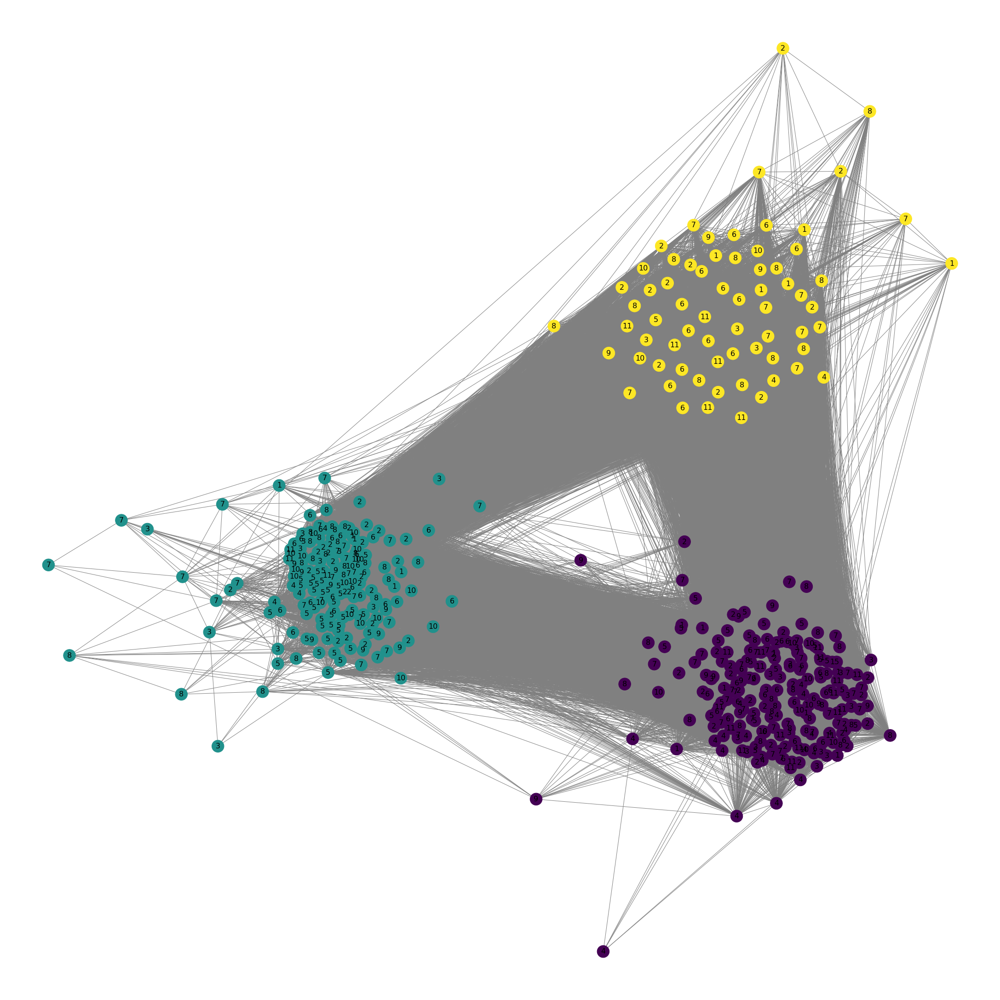

In [93]:
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx

def community_layout(g, partition):
    """
    Compute the layout for a modular graph.


    Arguments:
    ----------
    g -- networkx.Graph or networkx.DiGraph instance
        graph to plot

    partition -- dict mapping int node -> int community
        graph partitions


    Returns:
    --------
    pos -- dict mapping int node -> (float x, float y)
        node positions

    """

    pos_communities = _position_communities(g, partition, scale=100.)

    pos_nodes = _position_nodes(g, partition, scale=100)

    # combine positions
    pos = dict()
    for node in g.nodes():
        pos[node] = pos_communities[node] + pos_nodes[node]

    return pos

def _position_communities(g, partition, **kwargs):

    # create a weighted graph, in which each node corresponds to a community,
    # and each edge weight to the number of edges between communities
    between_community_edges = _find_between_community_edges(g, partition)

    communities = set(partition.values())
    hypergraph = nx.DiGraph()
    hypergraph.add_nodes_from(communities)
    for (ci, cj), edges in between_community_edges.items():
        hypergraph.add_edge(ci, cj, weight=len(edges))

    # find layout for communities
    pos_communities = nx.spring_layout(hypergraph, **kwargs)

    # set node positions to position of community
    pos = dict()
    for node, community in partition.items():
        pos[node] = pos_communities[community]

    return pos

def _find_between_community_edges(g, partition):

    edges = dict()

    for (ni, nj) in g.edges():
        ci = partition[ni]
        cj = partition[nj]

        if ci != cj:
            try:
                edges[(ci, cj)] += [(ni, nj)]
            except KeyError:
                edges[(ci, cj)] = [(ni, nj)]

    return edges

def _position_nodes(g, partition, **kwargs):
    """
    Positions nodes within communities.
    """

    communities = dict()
    for node, community in partition.items():
        try:
            communities[community] += [node]
        except KeyError:
            communities[community] = [node]

    pos = dict()
    for ci, nodes in communities.items():
        subgraph = g.subgraph(nodes)
        pos_subgraph = nx.spring_layout(subgraph, **kwargs)
        pos.update(pos_subgraph)

    return pos


pos = community_layout(G, original_part)
values = [original_part.get(node) for node in G.nodes()]

plt.figure(3,figsize=(30,30))
nx.draw(G, pos, node_color = values, node_size=700, with_labels=False, edge_color = 'grey')
nx.draw_networkx_labels(G,pos,labels,font_size=16)
plt.show()

In [95]:
def create_np(df, name):

    i=0
    corr_tensor = []
    dates = []
    while i < len(df):
        sub_df = df.iloc[i:min(i+30,len(df))]
        corr = sub_df.corr(method='pearson')
        corr_np = corr.to_numpy()
        corr_tensor.append(corr_np)
        dates.append(df.index.values[i])
        i += 30
    corr_tensor = np.asarray(corr_tensor)
    tmp_dates = [pd.to_datetime(x) for x in dates]
    dates = np.asarray(tmp_dates)
    nodes = np.asarray(df.columns.values)

    np.save(name + '_corr', corr_tensor)
    np.save(name + '_dates', dates)
    np.save(name + '_nodes', nodes)

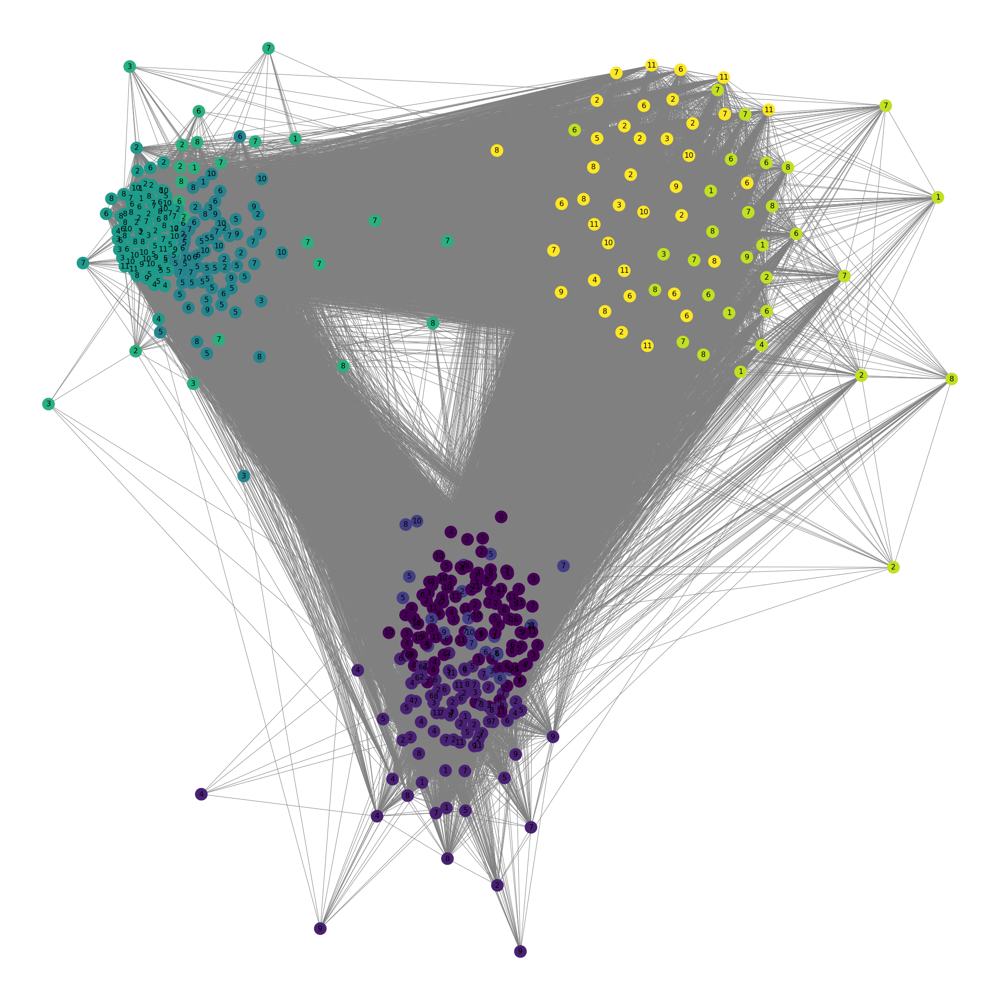

In [100]:
import collections
res = collections.defaultdict(list) 
for key, val in sorted(original_part.items()):
    res[val].append(key) 

myQueue = []
for val in res.values():
    myQueue.append((val, 1))

num_iters = 2

part = {}
    
while myQueue[0][1] < num_iters:
    val, i = myQueue[0]
    #print(i)
    myQueue = myQueue[1:]
    
    os.chdir("../data_generation")
    sp500_df = pd.read_csv("sp500_df.csv") 
    df = sp500_df[val].copy()
    
    os.chdir("../data_modified")
    create_np(df, "module_" + val[0])
    
    corr_tensor = np.load('%s_corr.npy' % ("module_" + val[0])) #list of correlation matrices for each date
    dates = np.load('%s_dates.npy' % ("module_" + val[0])) #list of timestamps
    nodes = np.load('%s_nodes.npy' % ("module_" + val[0])) #list of tickers

    num_examples = corr_tensor.shape[0] #number of dates
    dim = corr_tensor.shape[1] #number of assets
    
    corr_mat = corr_tensor[int(num_examples/2), :, :].copy() #take the correlation matrix for a specific date (for visualization)
    corr_mat[(corr_mat > -1*0.5) & (corr_mat < 0.5)] = 0 #arbitrary threshold, for visualization purposes
    new_G, density = make_graph(corr_mat, nodes, 'corr')
    
    # Find modularity
    temp_part = community_louvain.best_partition(new_G)
    part.update(temp_part)
    mod = community_louvain.modularity(part,new_G)
    
    res = collections.defaultdict(list) 
    for key, val in sorted(part.items()):
        res[val].append(key) 
    
    for val in res.values():
        myQueue.append((val, i+1))

# Plot, color nodes using community structure    
pos = community_layout(G, original_part)
values = [original_part.get(node) + 0.2*part.get(node) for node in G.nodes()]

plt.figure(3,figsize=(30,30))
nx.draw(G, pos, node_color = values, node_size=700, with_labels=False, edge_color = 'grey')
nx.draw_networkx_labels(G,pos,labels,font_size=16)
plt.show()

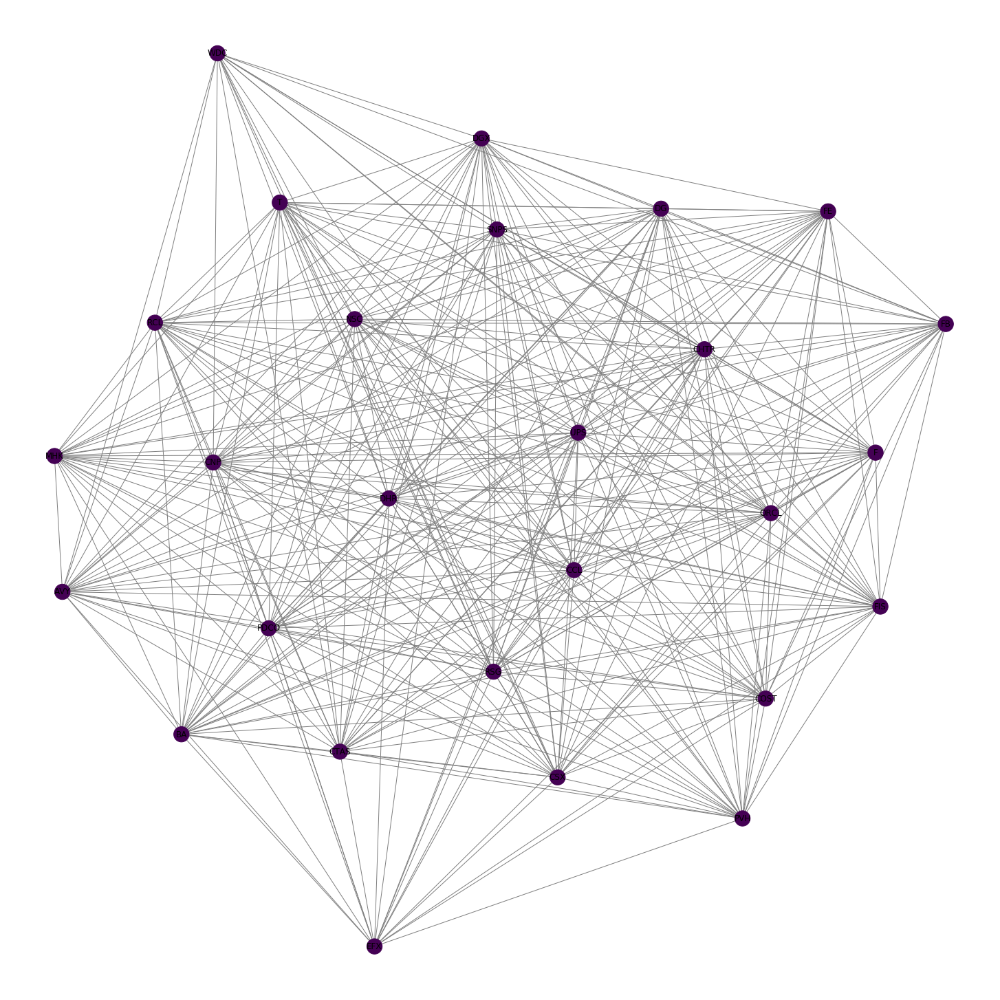

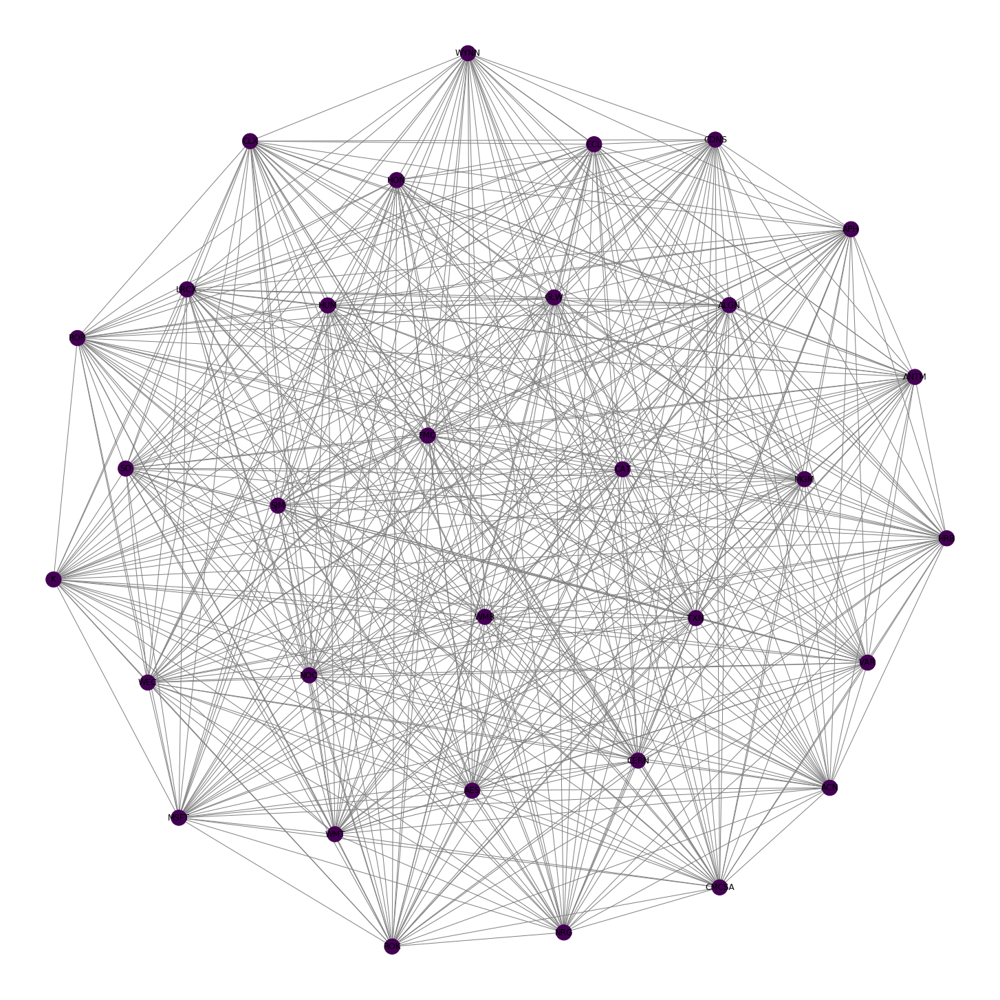

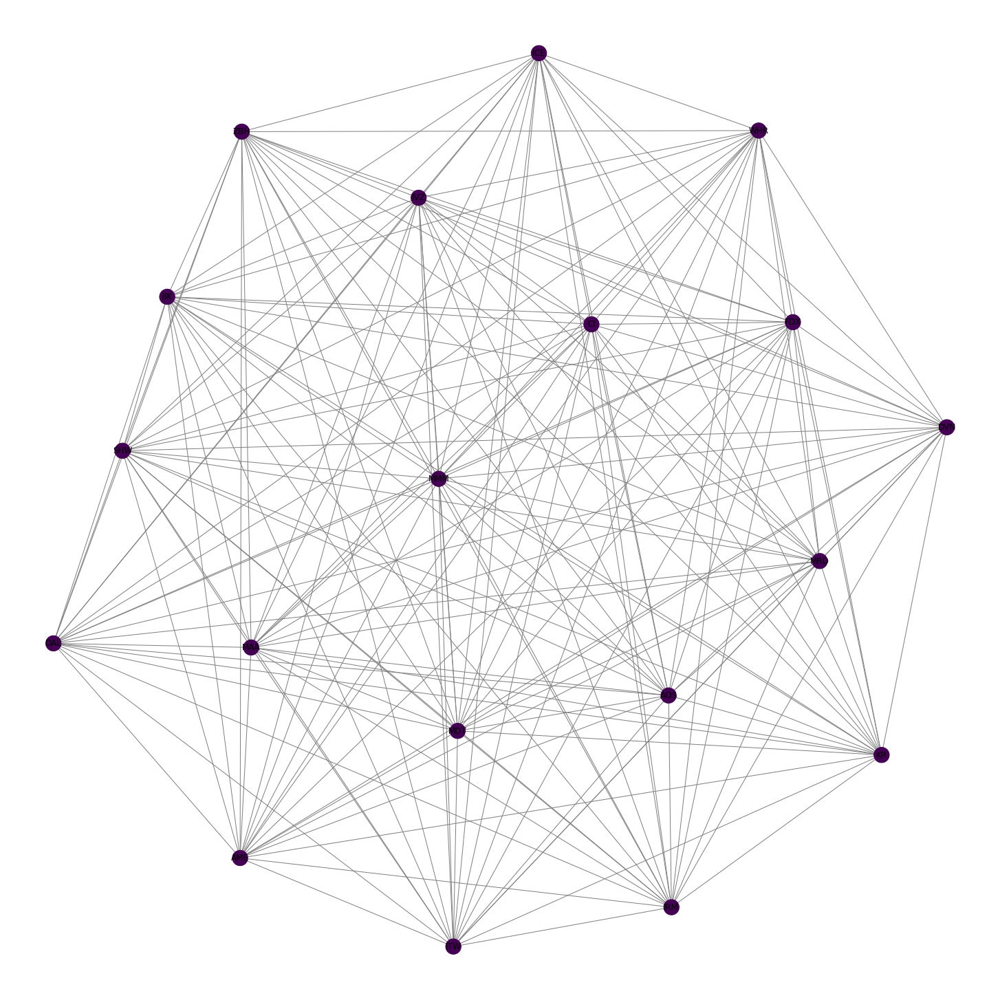

In [78]:
import collections
res = collections.defaultdict(list) 
for key, val in sorted(part.items()):
    res[val].append(key) 

myQueue = []
myGraphs = []
for val in res.values():
    if len(val) > 45:
        myQueue.append(val)
    else:
        os.chdir("../data_generation")
        sp500_df = pd.read_csv("sp500_df.csv") 
        df = sp500_df[val].copy()

        os.chdir("../data_modified")
        create_np(df, "module_" + val[0])

        corr_tensor = np.load('%s_corr.npy' % ("module_" + val[0])) #list of correlation matrices for each date
        dates = np.load('%s_dates.npy' % ("module_" + val[0])) #list of timestamps
        nodes = np.load('%s_nodes.npy' % ("module_" + val[0])) #list of tickers

        num_examples = corr_tensor.shape[0] #number of dates
        dim = corr_tensor.shape[1] #number of assets

        corr_mat = corr_tensor[int(num_examples/2), :, :].copy() #take the correlation matrix for a specific date (for visualization)
        corr_mat[(corr_mat > -1*0.5) & (corr_mat < 0.5)] = 0 #arbitrary threshold, for visualization purposes
        G, density = make_graph(corr_mat, nodes, 'corr')
        
        myGraphs.append((G, corr_tensor, dates, nodes))
    
while myQueue:
    val = myQueue[0]
    myQueue = myQueue[1:]
    
    os.chdir("../data_generation")
    sp500_df = pd.read_csv("sp500_df.csv") 
    df = sp500_df[val].copy()
    
    os.chdir("../data_modified")
    create_np(df, "module_" + val[0])
    
    corr_tensor = np.load('%s_corr.npy' % ("module_" + val[0])) #list of correlation matrices for each date
    dates = np.load('%s_dates.npy' % ("module_" + val[0])) #list of timestamps
    nodes = np.load('%s_nodes.npy' % ("module_" + val[0])) #list of tickers

    num_examples = corr_tensor.shape[0] #number of dates
    dim = corr_tensor.shape[1] #number of assets
    
    corr_mat = corr_tensor[int(num_examples/2), :, :].copy() #take the correlation matrix for a specific date (for visualization)
    corr_mat[(corr_mat > -1*0.5) & (corr_mat < 0.5)] = 0 #arbitrary threshold, for visualization purposes
    G, density = make_graph(corr_mat, nodes, 'corr')
    
    # Find modularity
    part = community_louvain.best_partition(G)
    mod = community_louvain.modularity(part,G)
    
    res = collections.defaultdict(list) 
    for key, val in sorted(part.items()):
        res[val].append(key) 
    
    for val in res.values():
        if len(val) > 45:
            print(len(val))
            myQueue.append(val)
        else:
            os.chdir("../data_generation")
            sp500_df = pd.read_csv("sp500_df.csv") 
            df = sp500_df[val].copy()

            os.chdir("../data_modified")
            create_np(df, "module_" + val[0])

            corr_tensor = np.load('%s_corr.npy' % ("module_" + val[0])) #list of correlation matrices for each date
            dates = np.load('%s_dates.npy' % ("module_" + val[0])) #list of timestamps
            nodes = np.load('%s_nodes.npy' % ("module_" + val[0])) #list of tickers

            num_examples = corr_tensor.shape[0] #number of dates
            dim = corr_tensor.shape[1] #number of assets

            corr_mat = corr_tensor[int(num_examples/2), :, :].copy() #take the correlation matrix for a specific date (for visualization)
            corr_mat[(corr_mat > -1*0.5) & (corr_mat < 0.5)] = 0 #arbitrary threshold, for visualization purposes
            G, density = make_graph(corr_mat, nodes, 'corr')

            myGraphs.append((G, corr_tensor, dates, nodes))
    

    # Plot, color nodes using community structure
    values = [part.get(node) for node in G.nodes()]
    plt.figure(3,figsize=(20,20))
    nx.draw_spring(G, node_color = values, node_size=500, with_labels=True, edge_color = 'grey')
    plt.show()
    

In [107]:
import pickle
with open("sp100_modules.txt", "wb") as fp:   #Pickling
    pickle.dump(myGraphs, fp)

In [101]:
# Run on various dates

mod_array = []
part_array = []
date_array = []
density_array = []
threshold_array = []

count = 0 #count to keep track of progress when running
for i in np.arange(0.1, 1, 0.1):
    for j in range(1, int(num_examples/5)): #division by 5 is just to speed up this for-loop, not necessary to have every month
        
        corr_mat = corr_tensor[j*5, :, :].copy()
        corr_mat[(corr_mat > -1*i) & (corr_mat < i)] = 0
        
        G, density = make_graph(corr_mat, nodes, 'corr')
        
        count += 1
        if count % 10 == 0: print("count: %d" % (count))
            
        part = community_louvain.best_partition(G)
        mod = community_louvain.modularity(part,G)
        
        part_array.append(part)
        mod_array.append(mod)
        density_array.append(density)
        date_array.append(dates[j*5])
        threshold_array.append(i)



count: 10
count: 20
count: 30
count: 40
count: 50
count: 60


Text(0, 0.5, 'Modularity')

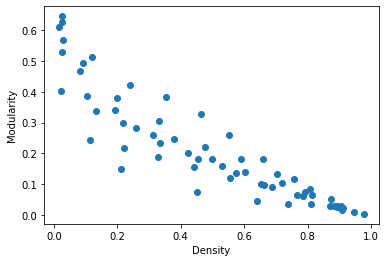

In [118]:
plt.plot(density_array, mod_array, 'o')
plt.xlabel('Density')
plt.ylabel('Modularity')